In [1]:
# we will be using the anscombe dataset in the seaborn library
# the anscombe dataset contain 4 sets of data, each of which contain two continuous variables 
# each set has the same mean, variance, correlation and regression line 
# however, only when we visualize the data can the differences between the dataset become obvious
# this goes to show the benefits of visualization and the pitfalls of looking at only summary statistics

# useful links : 
# < https://matplotlib.org/3.2.1/api/_as_gen/matplotlib.pyplot.plot.html > 



In [2]:
import seaborn as sns
anscombe  = sns.load_dataset("anscombe")
tips = sns.load_dataset("tips")
anscombe.head(10)

,dataset,x,y
0,I,10.0,8.04
1,I,8.0,6.95
2,I,13.0,7.58
3,I,9.0,8.81
4,I,11.0,8.33
5,I,14.0,9.96
6,I,6.0,7.24
7,I,4.0,4.26
8,I,12.0,10.84
9,I,7.0,4.82


In [3]:
anscombe.groupby("dataset")[["x","y"]].describe()

x                                               y            \
        count mean       std  min  25%  50%   75%   max count      mean   
dataset                                                                   
I        11.0  9.0  3.316625  4.0  6.5  9.0  11.5  14.0  11.0  7.500909   
II       11.0  9.0  3.316625  4.0  6.5  9.0  11.5  14.0  11.0  7.500909   
III      11.0  9.0  3.316625  4.0  6.5  9.0  11.5  14.0  11.0  7.500000   
IV       11.0  9.0  3.316625  8.0  8.0  8.0   8.0  19.0  11.0  7.500909   

                                                   
              std   min    25%   50%   75%    max  
dataset                                            
I        2.031568  4.26  6.315  7.58  8.57  10.84  
II       2.031657  3.10  6.695  8.14  8.95   9.26  
III      2.030424  5.39  6.250  7.11  7.98  12.74  
IV       2.030579  5.25  6.170  7.04  8.19  12.50

# Creating the subsets of data

In [4]:
# we need create the subsets of data in anscombe 

dataset1 = anscombe[anscombe["dataset"] == "I"]
dataset2 = anscombe[anscombe["dataset"] == "II"]
dataset3 = anscombe[anscombe["dataset"] == "III"]
dataset4 = anscombe[anscombe["dataset"] == "IV"]

# Matplotlib

In [5]:
# matplotlib is Python's fundamental plotting library 
# the package < matplotlib > contains all the plotting utilities which is stored in various subpackages called pyplot

In [6]:
import matplotlib.pyplot as plt

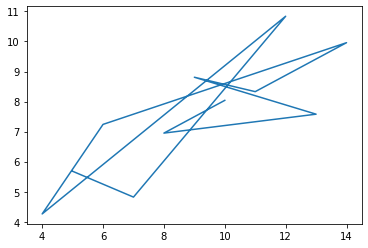

In [7]:
plt.plot(dataset1["x"], dataset1["y"])
# by default, plt.plot will plot lines, if we want "o" instead of lines, we can pass a parameter

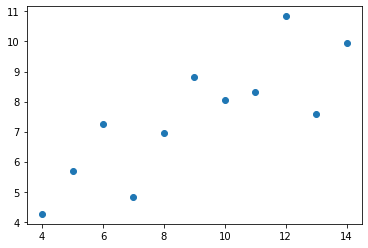

In [8]:
plt.plot(dataset1["x"], dataset1["y"], "o")

# Creating Subplots more efficiently

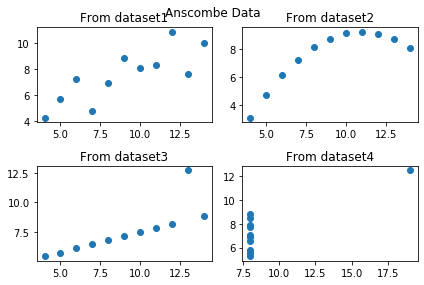

In [9]:
fig = plt.figure() # create a chart figure 

# subplot creation #
axes1 = fig.add_subplot(2,2,1) # plot location 1
axes2 = fig.add_subplot(2,2,2) # plot location 2
axes3 = fig.add_subplot(2,2,3) # plot location 3
axes4 = fig.add_subplot(2,2,4) # plot location 4
###

# the above 2,2 create 2 rows and 2 columns in the figure
# the subplot location is squentially numbered and the plots are placed first in a left-right direction, then top-to-bottom direction 

# this assign the dataset to each of the subplots
axes1.plot(dataset1["x"],dataset1["y"],"o")
axes2.plot(dataset2["x"],dataset2["y"],"o")
axes3.plot(dataset3["x"],dataset3["y"],"o")
axes4.plot(dataset4["x"],dataset4["y"],"o")

# this assign the title of each subplot
axes1.set_title("From dataset1")
axes2.set_title("From dataset2")
axes3.set_title("From dataset3")
axes4.set_title("From dataset4")

fig.suptitle("Anscombe Data")
fig.tight_layout()

# Statistical Graphics using matplotlib

In [10]:
# Univariate Analysis - Histogram 

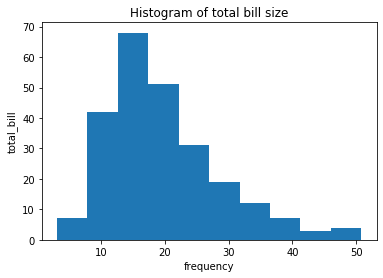

In [11]:
bill_hist = plt.hist(tips["total_bill"], bins = 10)
plt.ylabel("total_bill")
plt.xlabel("frequency")
plt.title("Histogram of total bill size")
plt.show()

In [12]:
# Bivariate analysis - Scatter Plot 
# useful when plotting a continuous variable with another continuous variable 

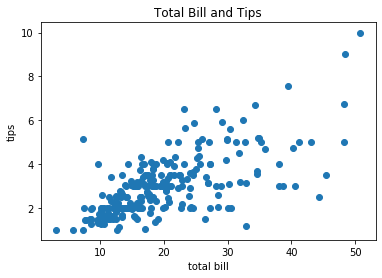

In [13]:
total_bill_tips = plt.scatter(tips["total_bill"], tips["tip"]) # note that the x axis comes firest
plt.xlabel("total bill")
plt.ylabel("tips")
plt.title("Total Bill and Tips")
plt.show()

In [14]:
# Bivariate Analysis - BoxPlot 
# useful when plotting a discretre variable against another continuous variable

Text(0.5, 1.0, 'Boxplot of Tips by Sex')

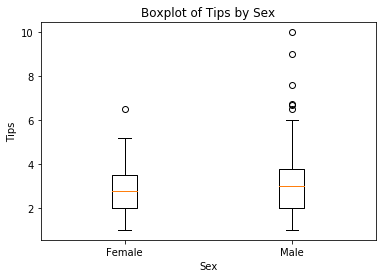

In [15]:
sex_tips = plt.boxplot([tips[tips.sex == "Female"]["tip"], tips[tips.sex == "Male"]["tip"]], labels = ["Female","Male"])
plt.xlabel("Sex")
plt.ylabel("Tips")
plt.title("Boxplot of Tips by Sex")

In [16]:
# Multivariate data and color coding
# If we want to display the 3rd and 4th variables on the graph, we can add color and size to the data points 
# When using size as a variable,note that human is not very good at differentiating size
# Note that in general, changes in color is easier to distinguish than changes in size

In [17]:
def recode_sex(sex):
    if sex == "Female" :
        return 0
    else : 
        return 1

In [18]:
tips["sex_color"] = tips["sex"].apply(recode_sex)

Text(0.5, 1.0, 'Total Bill vs Tips')

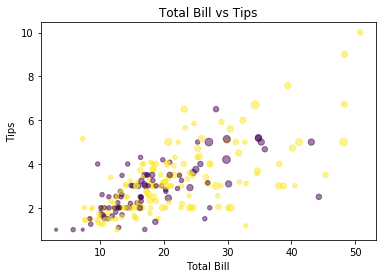

In [19]:
bill_sex = plt.scatter(tips["total_bill"],tips["tip"], s = tips["size"] *10, c = tips["sex_color"], alpha = 0.5)
plt.xlabel("Total Bill")
plt.ylabel("Tips")
plt.title("Total Bill vs Tips")

# Plotting Functionalities with the Seaborn Library

In [20]:
# Univariate Data Analysis

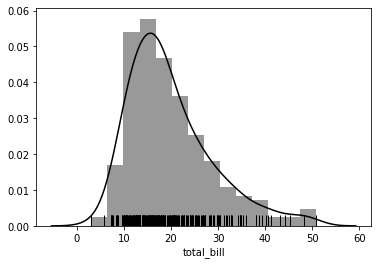

In [21]:
bills_distri_plot = sns.distplot(tips["total_bill"], hist = True, kde = True, rug = True, color = "k")
# note that distplot is a method from the sns package

# by default, hist = True, kde = True, rug = False
# hist is the option to display the histogram
# kde is the option to display the density plot
# rug is the option to display the variable distribution

Text(0.5, 1.0, 'Total Bill Density Plot')

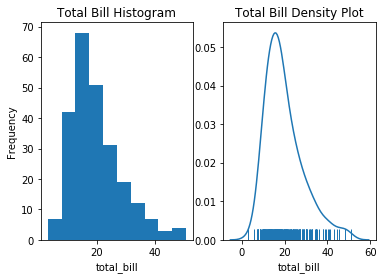

In [22]:
total_bill_histogram = plt.figure()

plot1 = total_bill_histogram.add_subplot(1,2,1)
plot2 = total_bill_histogram.add_subplot(1,2,2)

plot1.hist(tips["total_bill"], bins = 10)
plot2 = sns.distplot(tips["total_bill"], hist = False, rug = True)

plot1.set_xlabel("total_bill")
plot1.set_ylabel("Frequency")
plot1.set_title("Total Bill Histogram")

plot2.set_title("Total Bill Density Plot")

Text(0.5, 1.0, 'Number of Bills on Days')

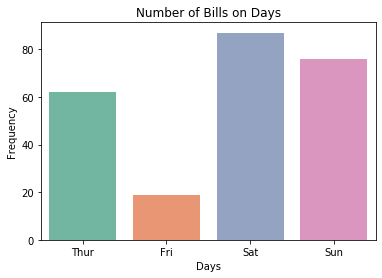

In [23]:
day_chart = sns.countplot(tips["day"], palette = "Set2")
plt.xlabel("Days")
plt.ylabel("Frequency")
plt.title("Number of Bills on Days")

In [24]:
# Bivariate Data Analysis

Text(0.5, 1.0, 'Relationship? between the bill size and tip')

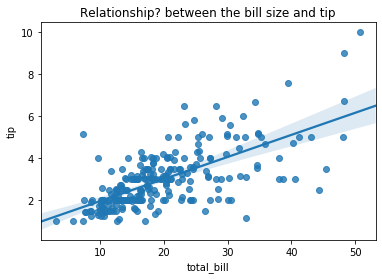

In [25]:
# Scatterplot chart
bill_tips_scatterplot = sns.regplot(x =  tips["total_bill"], y = tips["tip"])
plt.title("Relationship? between the bill size and tip")
# regplot will also fit a regression line
# by default, fit_reg = True where we will display the regression line 

Text(0.5, 1.03, 'Joint Plot of total bill and tip')

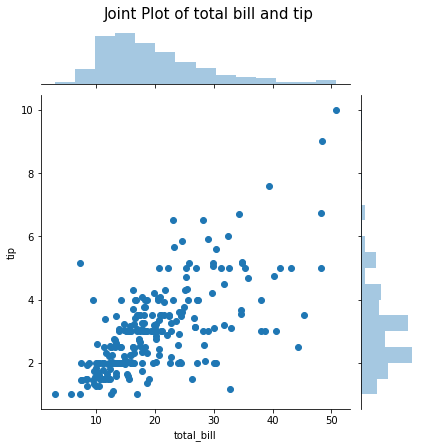

In [26]:
# Scatterplot chart with univariate distribution chart
bill_tips_scatterplot_dist = sns.jointplot(x = tips["total_bill"], y = tips["tip"])
bill_tips_scatterplot_dist.fig.suptitle("Joint Plot of total bill and tip", fontsize = 15, y = 1.03)

Text(0.5, 1.03, 'Hexbin Joint Plot of Total Bill and Tip')

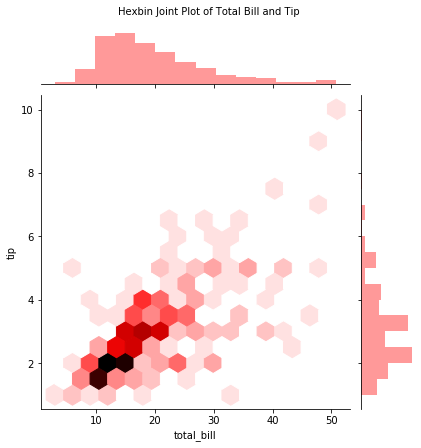

In [27]:
# Hexbin plot
bill_tips_hexbin = sns.jointplot(x = tips["total_bill"], y = tips["tip"], kind = "hex", color = "r")
bill_tips_hexbin.fig.suptitle("Hexbin Joint Plot of Total Bill and Tip", fontsize = 10, y = 1.03)

Text(0.5, 1.0, 'Kernel Density Plot of Total Bill and Tip')

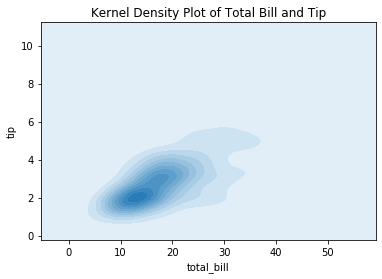

In [28]:
# 2D Density Plot
bill_tips_density_plot = sns.kdeplot(data = tips["total_bill"], data2 = tips["tip"], shade = True)
plt.title("Kernel Density Plot of Total Bill and Tip")

Text(0.5, 1.03, 'KDE Joint Plot of Total Bill and Tip')

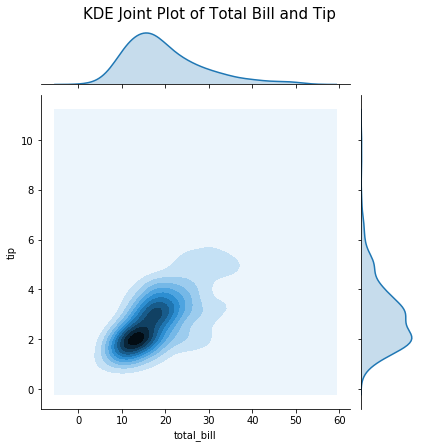

In [29]:
# KDE JOINT PLOT
bill_density_kde_joint = sns.jointplot(x = tips["total_bill"], y = tips["tip"], kind = "kde")
bill_density_kde_joint.fig.suptitle("KDE Joint Plot of Total Bill and Tip", fontsize = 15, y = 1.03)

In [30]:
import numpy as np

Text(0.5, 1.0, 'Sum of all bill')

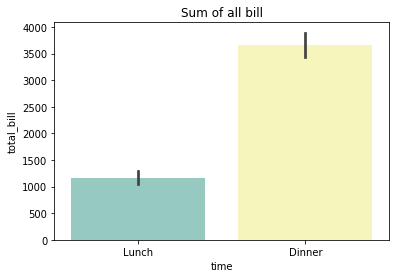

In [31]:
# Barplot
bill_time_barplot = sns.barplot(x = tips["time"], y = tips["total_bill"], estimator = np.sum, palette = "Set3")
plt.title("Sum of all bill")
# by default, the estimater is np.mean

Text(0.5, 1.0, 'Distribution of bill size across different time')

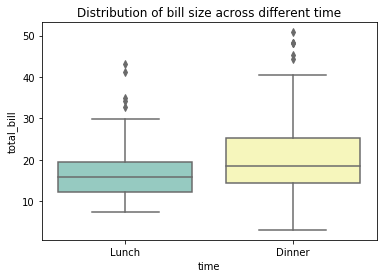

In [32]:
# Boxplot
bill_tip_boxplot = sns.boxplot(x = tips["time"], y = tips["total_bill"], palette = "Set3")
plt.title("Distribution of bill size across different time")

Text(0.5, 1.0, 'Distribution of bill size across different time')

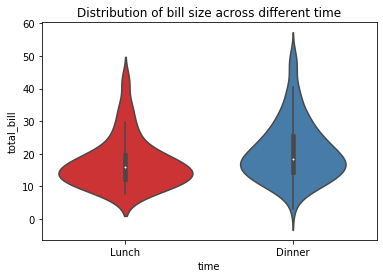

In [33]:
# Violin Plot 
# Instead of using a boxplot to display the statistical visualization, we can use  a violin plot to plot the underlyiing distribution
time_bill_violin_plot = sns.violinplot(x = tips["time"], y = tips["total_bill"], palette = "Set1")
plt.title("Distribution of bill size across different time")

In [34]:
# pairwise relationship 
# when you have mainly numeric data, visualizing all the pairwise relationship can be useful
tips.head()

,total_bill,tip,sex,smoker,day,time,size,sex_color
0,16.99,1.01,Female,No,Sun,Dinner,2,0
1,10.34,1.66,Male,No,Sun,Dinner,3,1
2,21.01,3.50,Male,No,Sun,Dinner,3,1
3,23.68,3.31,Male,No,Sun,Dinner,2,1
4,24.59,3.61,Female,No,Sun,Dinner,4,0


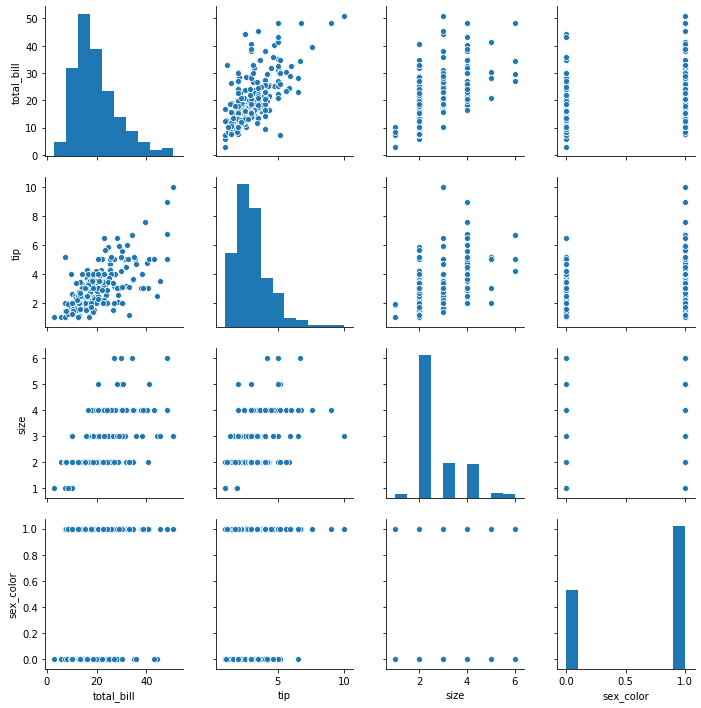

In [35]:
sns.pairplot(tips,palette="Set2")

In [36]:
# one of the drawback of using the pairplot is that the top half of the plot is the same as the bottom half
# we can pairgrid to manually assign the plots

In [37]:
tips.columns

Index(['total_bill', 'tip', 'sex', 'smoker', 'day', 'time', 'size',
       'sex_color'],
      dtype='object')

Text(0.5, 49.99999999999995, 'te')

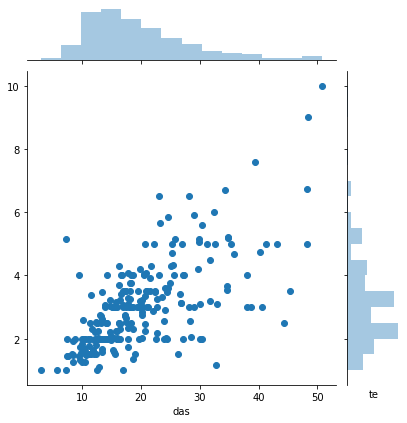

In [38]:
d = sns.jointplot(x="total_bill", y ="tip", data=tips)
d.set_axis_labels(xlabel="das")
plt.xlabel("te")

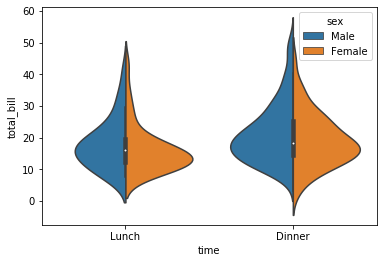

In [39]:
sns.violinplot(x="time", y="total_bill", hue="sex", data=tips, split=True)

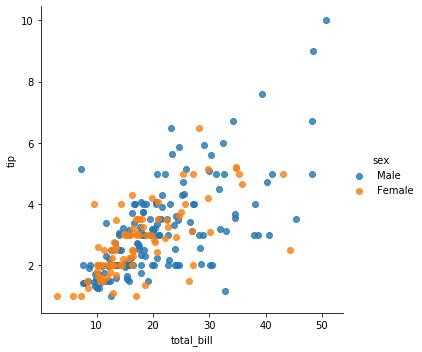

In [40]:
sns.lmplot(x="total_bill", y="tip", data=tips, hue="sex", fit_reg=False)

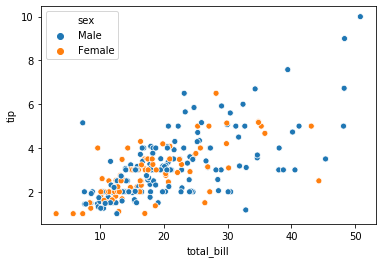

In [41]:
sns.scatterplot(x="total_bill", y="tip",data=tips, hue="sex", markers=["o","x"])

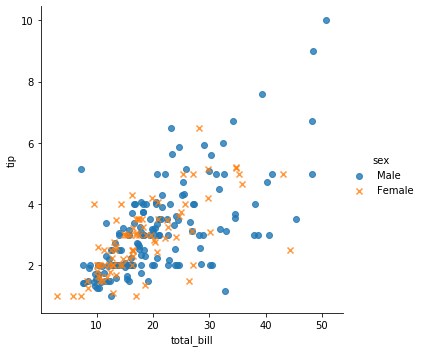

In [42]:
sns.lmplot(x="total_bill", y="tip", data=tips, hue="sex", fit_reg=False, markers=["o","x"])

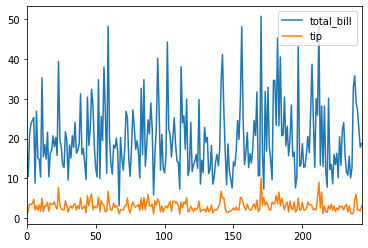

In [43]:
tips[["total_bill","tip"]].plot.line()

Text(0.5, 0, 'total_bill')

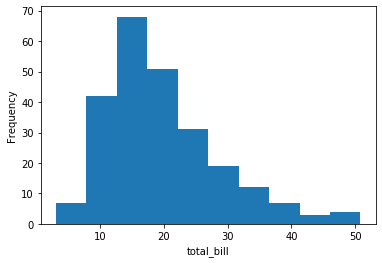

In [44]:
tips["total_bill"].plot.hist()
plt.xlabel("total_bill")

In [45]:
# Facets
anscombe.head()

,dataset,x,y
0,I,10.0,8.04
1,I,8.0,6.95
2,I,13.0,7.58
3,I,9.0,8.81
4,I,11.0,8.33


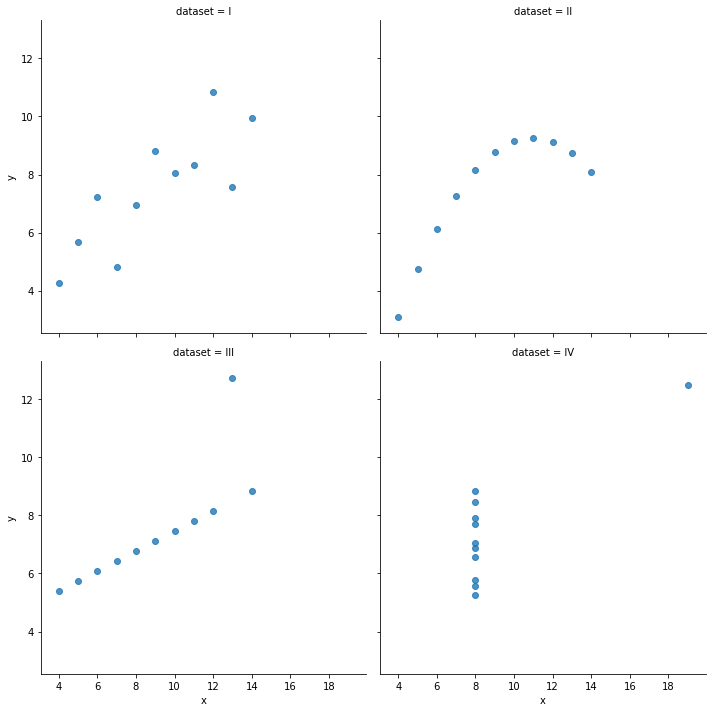

In [46]:
sns.lmplot(x="x", y ="y", data=anscombe, fit_reg=False, col="dataset", col_wrap=2)

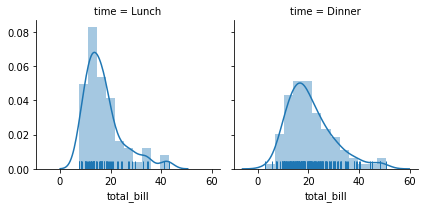

In [47]:
facet = sns.FacetGrid(tips, col="time")
facet.map(sns.distplot, "total_bill", rug=True)

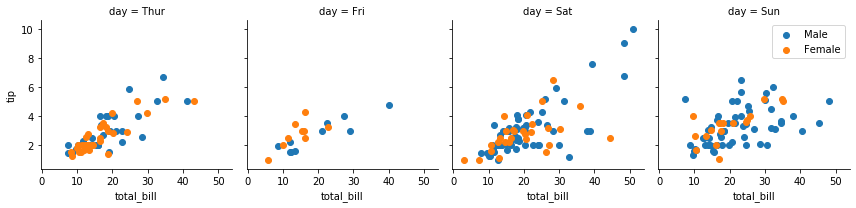

In [48]:
y = sns.FacetGrid(tips, col="day", hue="sex")
y.map(plt.scatter, "total_bill", "tip")
plt.legend()

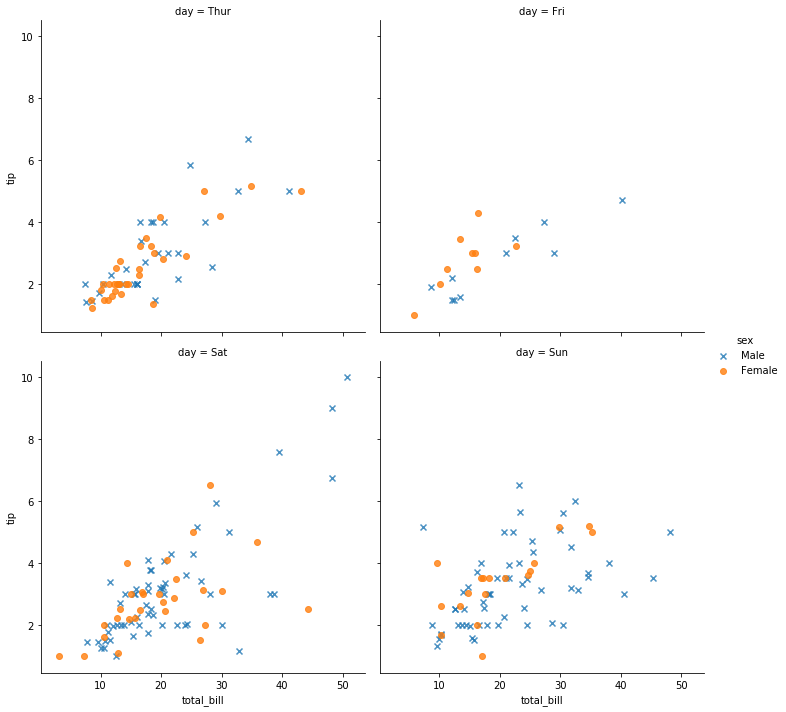

In [52]:
# we can also create the above chart with the following codes:

sns.lmplot(x="total_bill", y="tip", data=tips, fit_reg=False, col="day",col_wrap=2, hue="sex", markers=["x","o"])

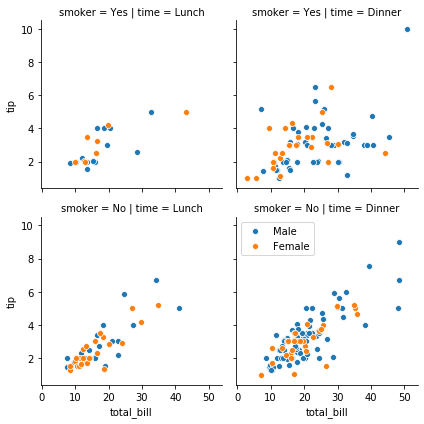

In [62]:
# 2 variables faceted on both axis

tips_facet = sns.FacetGrid(tips, row="smoker", col="time", hue="sex")
tips_facet.map(sns.scatterplot, "total_bill", "tip")
plt.legend()

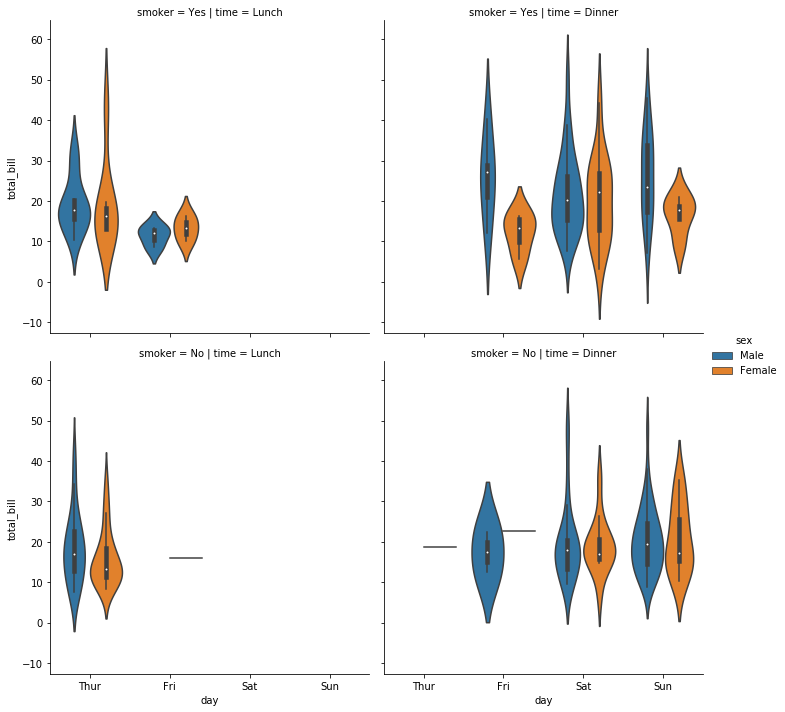

In [74]:
sns.catplot(x="day", y="total_bill", hue="sex", data=tips, row="smoker", col="time",kind="violin")

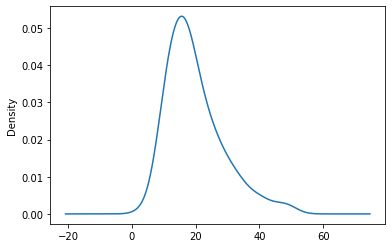

In [76]:
tips["total_bill"].plot.kde()

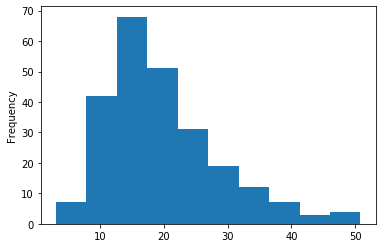

In [77]:
tips["total_bill"].plot.hist()

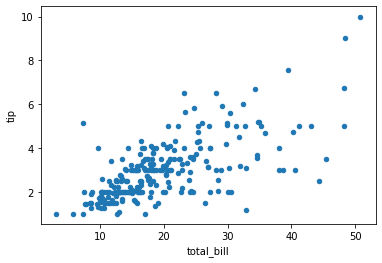

In [85]:
tips.plot.scatter(x="total_bill", y="tip")

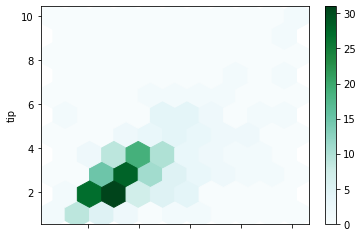

In [89]:
tips.plot.hexbin(x="total_bill", y="tip", gridsize=10)

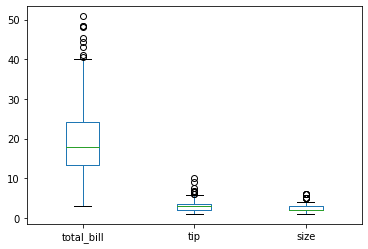

In [91]:
tips.plot.box() # this only plot the numercial values

# Setting Seaborn Style

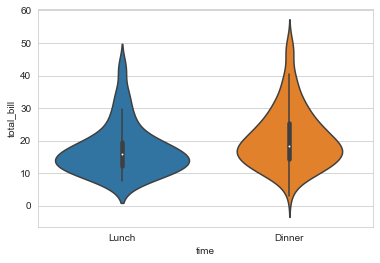

In [102]:
sns.set_style("whitegrid")
sns.violinplot(x="time", y ="total_bill", data=tips)

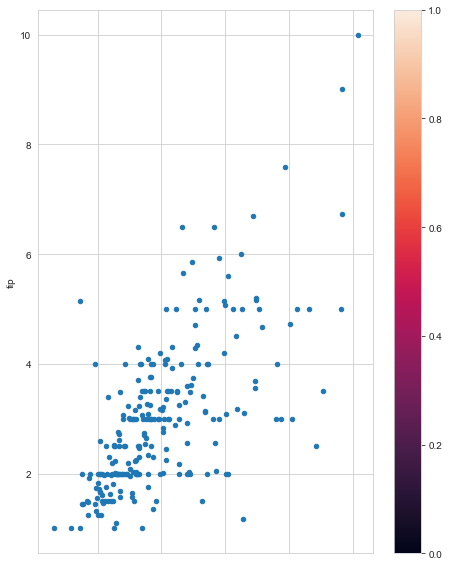

In [105]:
tips.plot.scatter(x="total_bill", y="tip", figsize=(7.5,10), colorbar=True)

# Sample data

In [107]:
import pandas as pd

housing = pd.read_csv(r"C:\Users\tanzh\Documents\AI & Machine Learning\Hands-On Machine Learning Codes\Datasets\housing.csv")

In [109]:
corr_matrix = housing.corr()

In [110]:
corr_matrix

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000


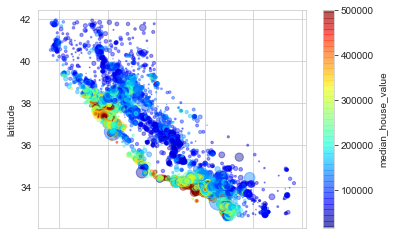

In [116]:
housing.plot.scatter(x="longitude", y="latitude", alpha=0.4, s=housing["population"] /100, c="median_house_value", cmap=plt.get_cmap("jet"), colorbar=True)